<a href="https://colab.research.google.com/github/mansi-guptaa/Object-detection.v3i.yolov5-obb/blob/main/Yolov8.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

##Problem statement

The project aims to train an object detection model to identify "Houses" and "Tennis Courts" in aerial images.
In essence, the problem revolves around developing a robust object detection solution for identifying "Houses" and "Tennis Courts" in aerial imagery, leveraging the capabilities of the YOLO framework and a curated dataset.

## Project Summary

**Object Detection in Aerial Imagery:** The  task involves detecting specific objects, namely "Houses" and "Tennis Courts", within aerial images.

**Dataset Preparation:** The code utilizes a dataset from Roboflow, a platform for managing computer vision datasets. The dataset likely contains aerial images annotated with bounding boxes around the objects of interest.

**Model Training:** The core of the problem involves training a YOLO model on the prepared dataset. The goal is to enable the model to accurately locate and classify instances of "Houses" and "Tennis Courts" in new, unseen aerial images.

**Model Evaluation and Prediction:** It includes steps to evaluate the trained model's performance and use it for making predictions on new images, as demonstrated by the code loading the best model weights and applying it to sample images.



## Steps Involved

This project involves the following steps:

**Setup:** Install necessary libraries like ultralytics and roboflow. Authenticate with Roboflow.

**Data Preparation:** Download the dataset from Roboflow. Rename the labelTxt folders to labels. Normalize the coordinates in the label files.

**Model Training:** Train a YOLOv8 model using the prepared dataset, specifying parameters like epochs, image size, and batch size.

**Evaluation:** Evaluate the trained model using provided metrics like confusion matrix.

**Prediction:** Load the best trained model weights and use it to predict objects in new images.

##Let's Begin

In [1]:
!nvidia-smi

Thu Sep  5 06:54:43 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   55C    P8              11W /  70W |      0MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [2]:
import os
HOME = os.getcwd()
print(HOME)

/content


In [3]:
!pip install ultralytics roboflow -q

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.8/41.8 kB 2.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 872.1/872.1 kB 23.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.9/79.9 kB 7.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 5.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 4.1 MB/s eta 0:00:00


In [4]:
import ultralytics
ultralytics.checks()
from  ultralytics import YOLO
import roboflow
from roboflow import Roboflow

Ultralytics YOLOv8.2.87 🚀 Python-3.10.12 torch-2.4.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 32.8/78.2 GB disk)


In [5]:
roboflow.login()

rf = Roboflow()

visit https://app.roboflow.com/auth-cli to get your authentication token.
Paste the authentication token here: ··········


In [6]:
project = rf.workspace("creation-wigww").project("object-detection-fo66p")
version = project.version(3)
dataset = version.download("yolov5-obb")

loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to Object-detection-3 in yolov5-obb:: 100%|██████████| 468/468 [00:00<00:00, 5694.48it/s]


In [7]:
Dataset = dataset.location

In [8]:

import os

# Specify the path to the folder
def changeFolderName(folder_path):
    # Specify the current folder name
    current_folder_name = 'labelTxt'

    # Specify the new folder name
    new_folder_name = 'labels'

    # Construct the full paths for the current and new folders
    current_folder_path = os.path.join(folder_path, current_folder_name)
    new_folder_path = os.path.join(folder_path, new_folder_name)

    # Rename the folder
    os.rename(current_folder_path, new_folder_path)


changeFolderName(f"{Dataset}/train/")
changeFolderName(f"{Dataset}/valid/")
changeFolderName(f"{Dataset}/test/")

In [11]:
import os

# Define class and their indexes
class_names = ['House', 'TennisCourt']
class_indices = {names : index for index, names in enumerate(class_names)}

img_width, img_height = 640, 640


folder_path = '/content/Object-detection-3/train/labels' # Replace the folder path for test and valid datset

# Function to normalise coordinates

def normalize_coordinates(coord, max_value):
    return float(coord) / max_value

# Process each file in folder
for filename in os.listdir(folder_path):
  if filename.endswith('.txt'):
    file_path = os.path.join(folder_path, filename)
    with open(file_path, 'r') as file:
      lines = file.readlines()

    new_lines = []
    for line in lines:
      parts = line.strip().split()
      if len(parts) == 10:
        label = parts[-2]
        coords = parts[:8]

        # Get class index
        class_index = class_indices.get(label, -1)
        if class_index != -1:
          # Normalize coordinates
          normalized_coords = [normalize_coordinates(coords[i], img_width if i % 2 == 0 else img_height) for i in range(8)]

          # Create new line with class index and normalized coordinates
          new_line = f"{class_index}  " + " ".join(map(str, normalized_coords))
          new_lines.append(new_line)

    # Write the modified lines back to the file
    with open(file_path, 'w') as file:
      file.write('\n'.join(new_lines))




In [13]:
%cd {HOME}
# Change the file in data.yml file to /content/Object-detection-3
!yolo task=obb mode=train model=yolov8m-obb.pt data={Dataset}/data.yaml epochs=50 imgsz=640 batch=10


/content
100% 755k/755k [00:00<00:00, 24.9MB/s]
Overriding model.yaml nc=15 with nc=2

                   from  n    params  module                                       arguments                     
  0                  -1  1      1392  ultralytics.nn.modules.conv.Conv             [3, 48, 3, 2]                 
  1                  -1  1     41664  ultralytics.nn.modules.conv.Conv             [48, 96, 3, 2]                
  2                  -1  2    111360  ultralytics.nn.modules.block.C2f             [96, 96, 2, True]             
  3                  -1  1    166272  ultralytics.nn.modules.conv.Conv             [96, 192, 3, 2]               
  4                  -1  4    813312  ultralytics.nn.modules.block.C2f             [192, 192, 4, True]           
  5                  -1  1    664320  ultralytics.nn.modules.conv.Conv             [192, 384, 3, 2]              
  6                  -1  4   3248640  ultralytics.nn.modules.block.C2f             [384, 384, 4, True]           
 

/content


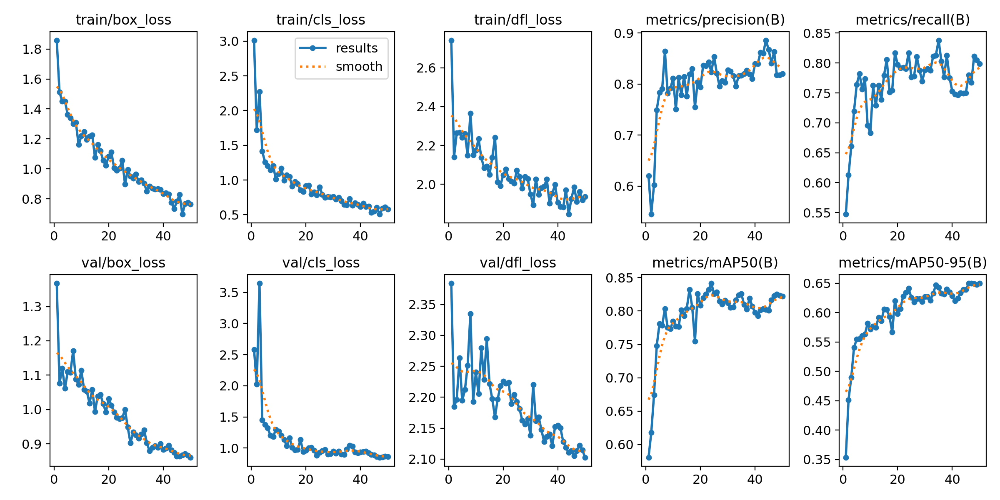

In [14]:
%cd {HOME}
from IPython.display import Image

Image(filename = f"{HOME}/runs/obb/train2/results.png",width = 1400)

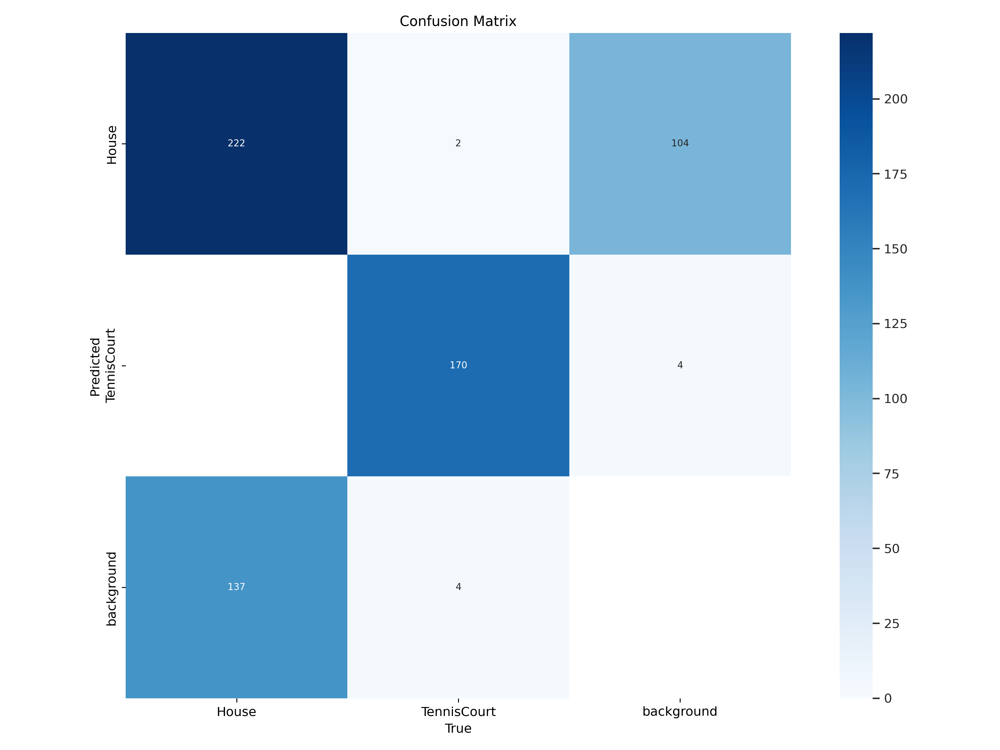

In [15]:
Image(filename = f"{HOME}/runs/obb/train2/confusion_matrix.png",width = 1000)

In [22]:
model  = YOLO('runs/obb/train2/weights/best.pt')
results = model('/content/P0234.png',imgsz= 640, save = True)


image 1/1 /content/P0234.png: 640x480 104.5ms
Speed: 3.9ms preprocess, 104.5ms inference, 3.5ms postprocess per image at shape (1, 3, 640, 480)
Results saved to runs/obb/predict2


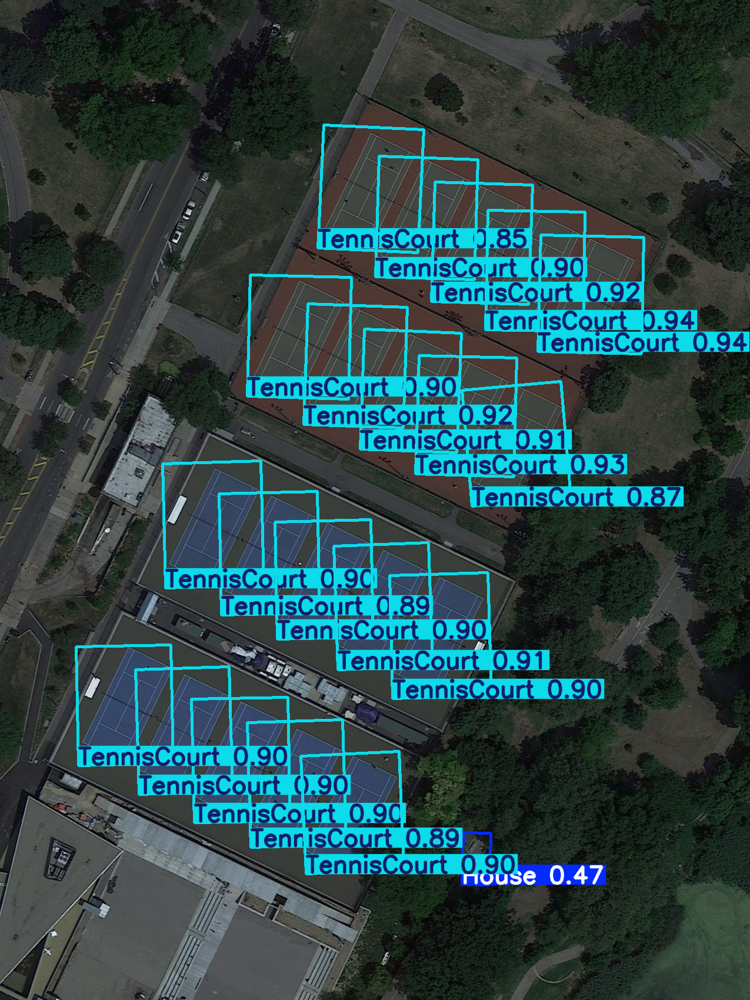

In [24]:
Image(filename = f"{HOME}/runs/obb/predict2/P0234.png",width = 1000)

In [25]:
model  = YOLO('runs/obb/train2/weights/best.pt')
results = model('/content/P0369.png',imgsz= 640, save = True)


image 1/1 /content/P0369.png: 352x640 51.6ms
Speed: 1.8ms preprocess, 51.6ms inference, 2.8ms postprocess per image at shape (1, 3, 352, 640)
Results saved to runs/obb/predict3


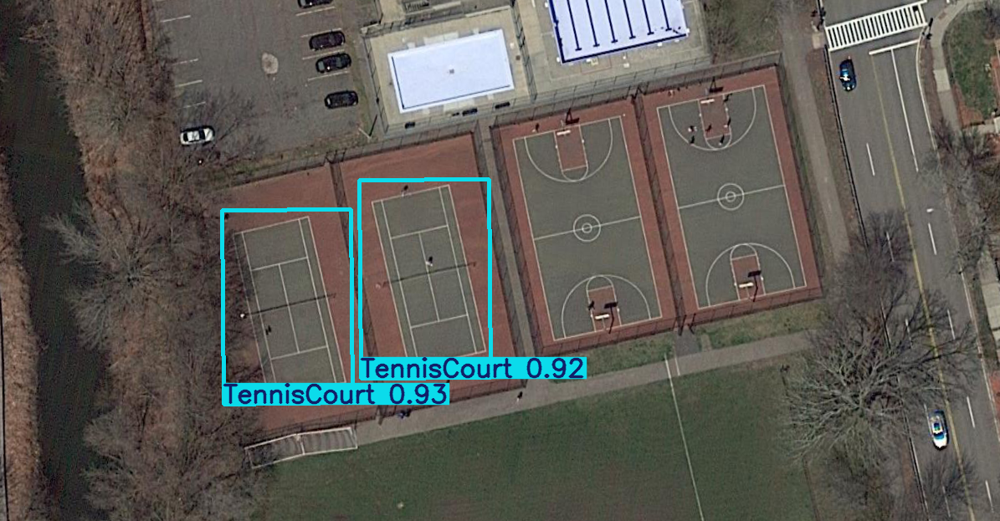

In [28]:
Image(filename = f"{HOME}/runs/obb/predict3/P0369.png",width = 1000)

In [27]:
model  = YOLO('runs/obb/train2/weights/best.pt')
results = model('/content/P0372.png',imgsz= 640, save = True)


image 1/1 /content/P0372.png: 640x480 29.7ms
Speed: 2.3ms preprocess, 29.7ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 480)
Results saved to runs/obb/predict4


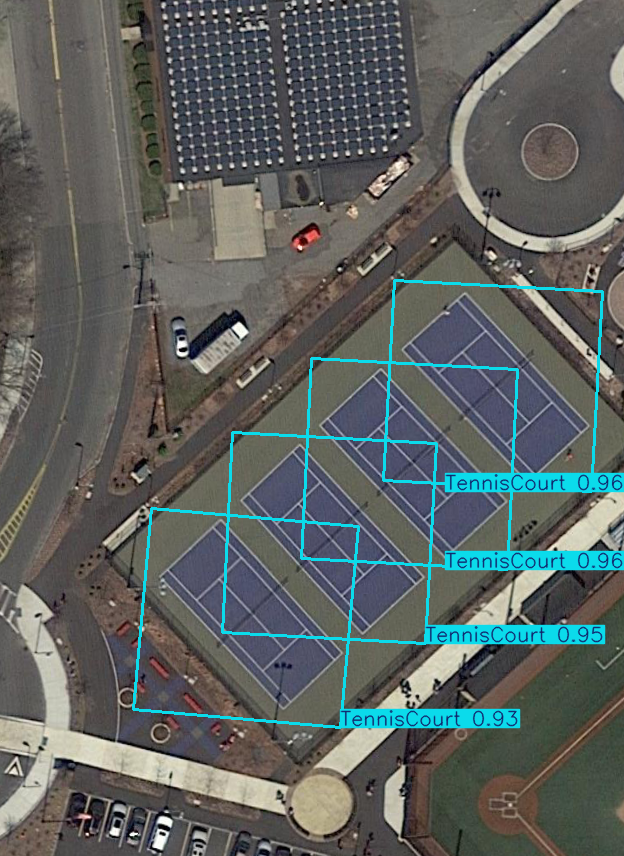

In [29]:
Image(filename = f"{HOME}/runs/obb/predict4/P0372.png",width = 1000)

In [30]:
model  = YOLO('runs/obb/train2/weights/best.pt')
results = model('/content/P0498.png',imgsz= 640, save = True)


image 1/1 /content/P0498.png: 640x640 38.5ms
Speed: 3.2ms preprocess, 38.5ms inference, 2.7ms postprocess per image at shape (1, 3, 640, 640)
Results saved to runs/obb/predict5


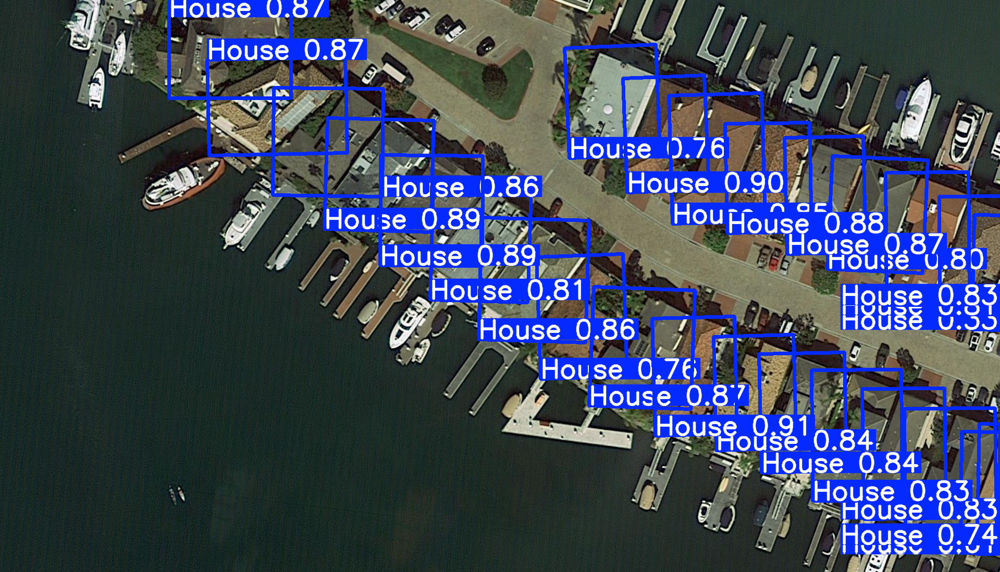

In [36]:
Image(filename = f"{HOME}/runs/obb/predict7/P0735.png",width = 2000)